In [14]:
# Import các thư viện cần thiết
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras import Model
from matplotlib import pyplot
from PIL import Image
import cv2
from numpy import expand_dims
import numpy as np

In [15]:
# Load model
model = VGG16()
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [16]:
# Lấy các layer conv:
convlayers_index = []
for i in range(len(model.layers)):
    layer = model.layers[i]
    if 'conv' not in layer.name:
        continue
    convlayers_index.append(i)
    print(i, layer.name)

1 block1_conv1
2 block1_conv2
4 block2_conv1
5 block2_conv2
7 block3_conv1
8 block3_conv2
9 block3_conv3
11 block4_conv1
12 block4_conv2
13 block4_conv3
15 block5_conv1
16 block5_conv2
17 block5_conv3


In [17]:
# Image input
size = 224
ori_img = load_img('/kaggle/input/mydataset/face.jpg', target_size=(size, size))
img = img_to_array(ori_img)
img = expand_dims(img, axis=0)
img.shape

(1, 224, 224, 3)

In [18]:
outputs = [model.layers[i].output for i in convlayers_index]
# Model for extracting features
model = Model(inputs=model.inputs, outputs=outputs)

In [19]:
feature_maps = model.predict(img)
feature_maps[0].shape

1/1 [==============================] - 0s 159ms/step


(1, 224, 224, 64)

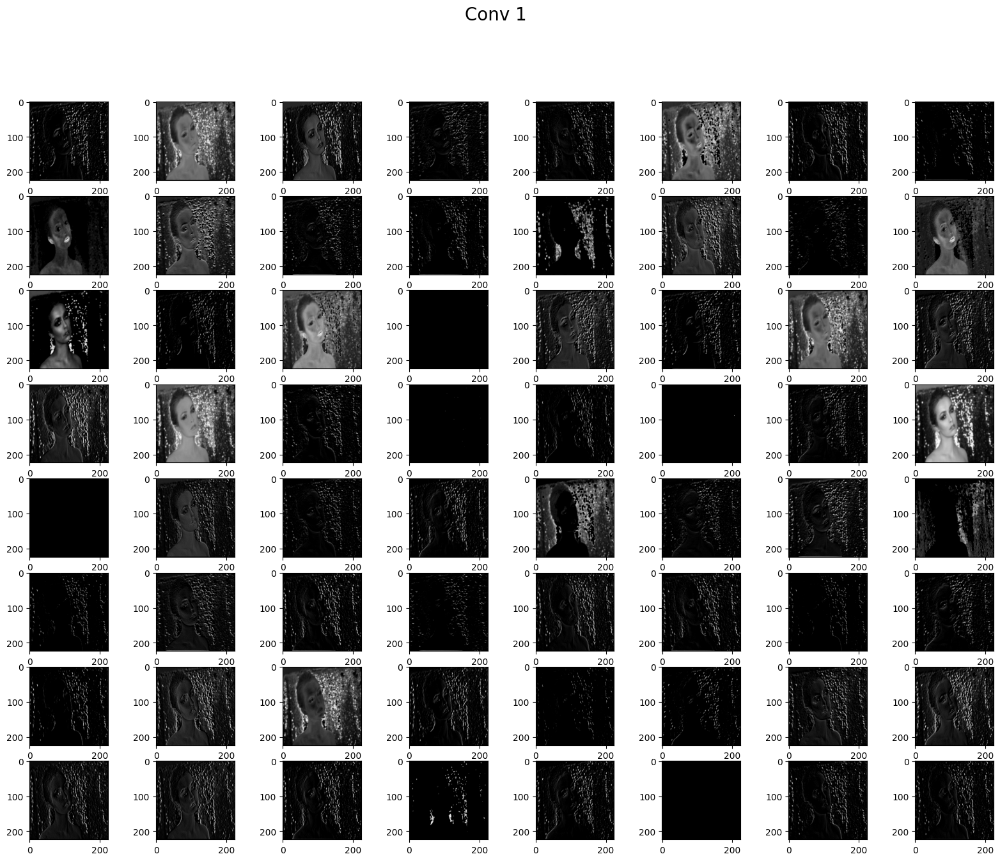

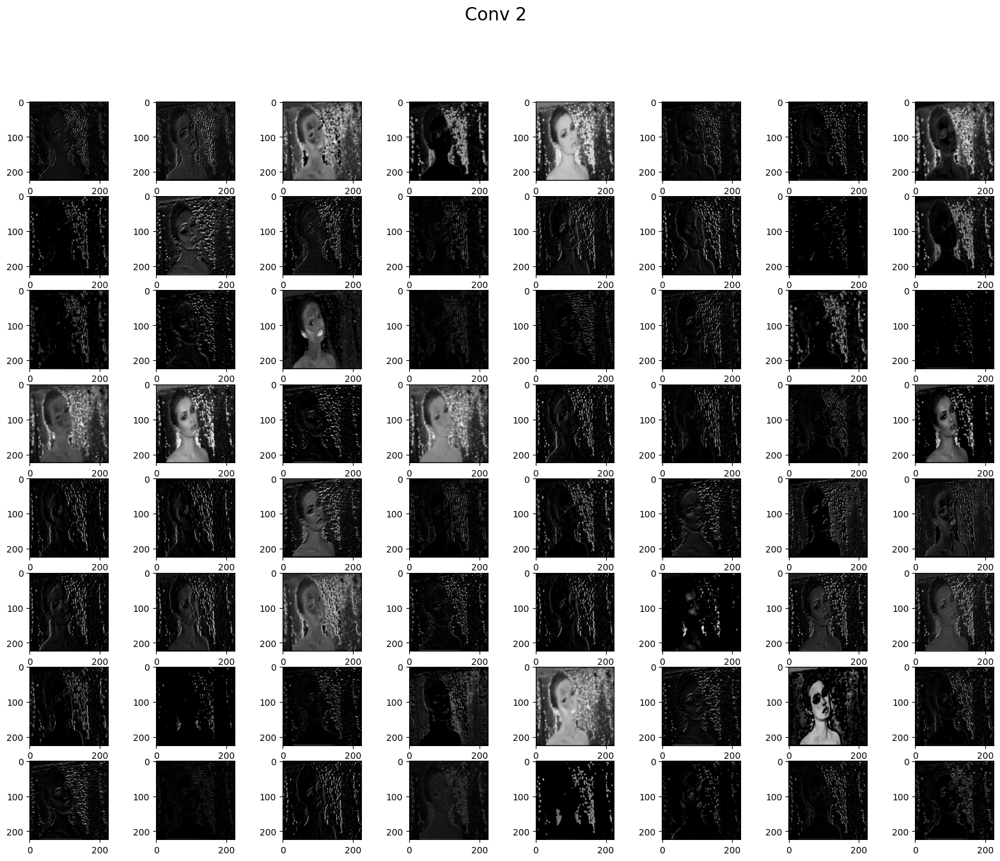

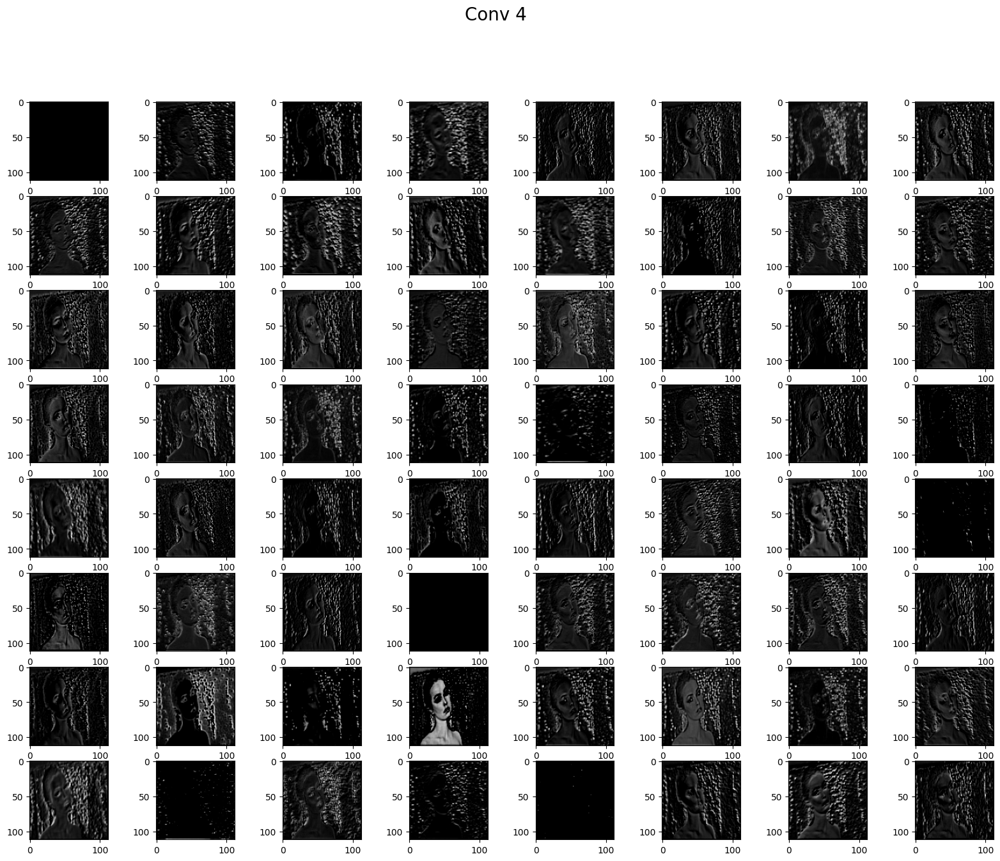

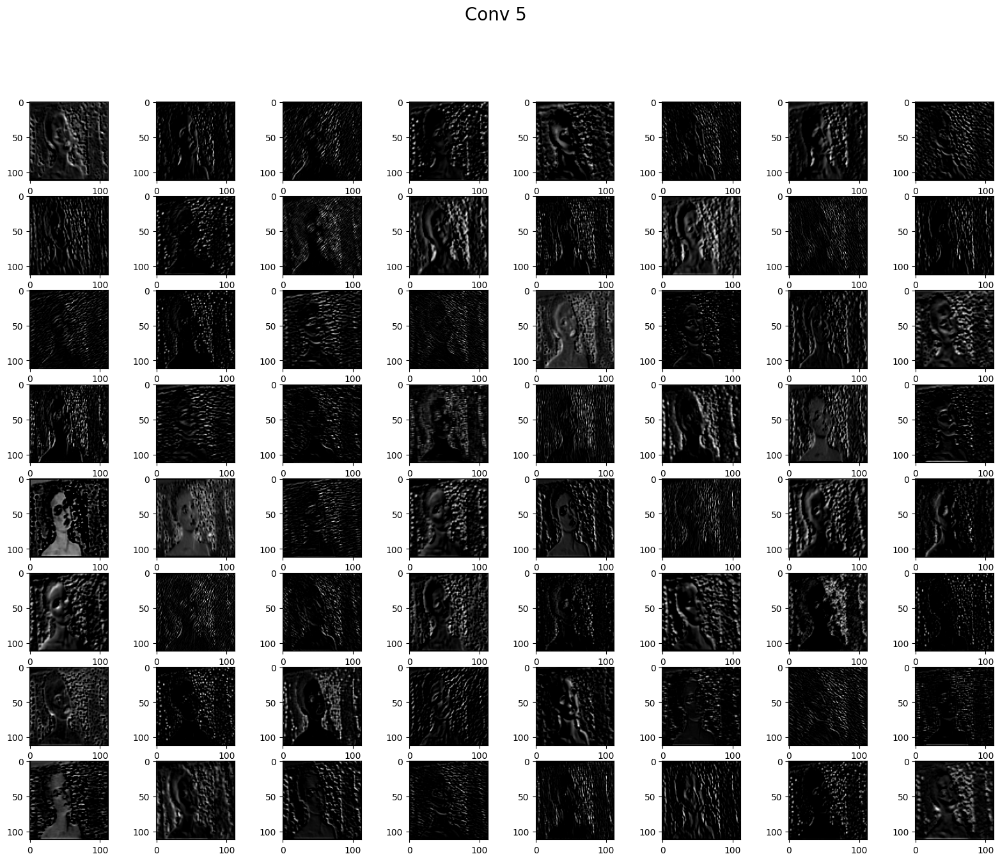

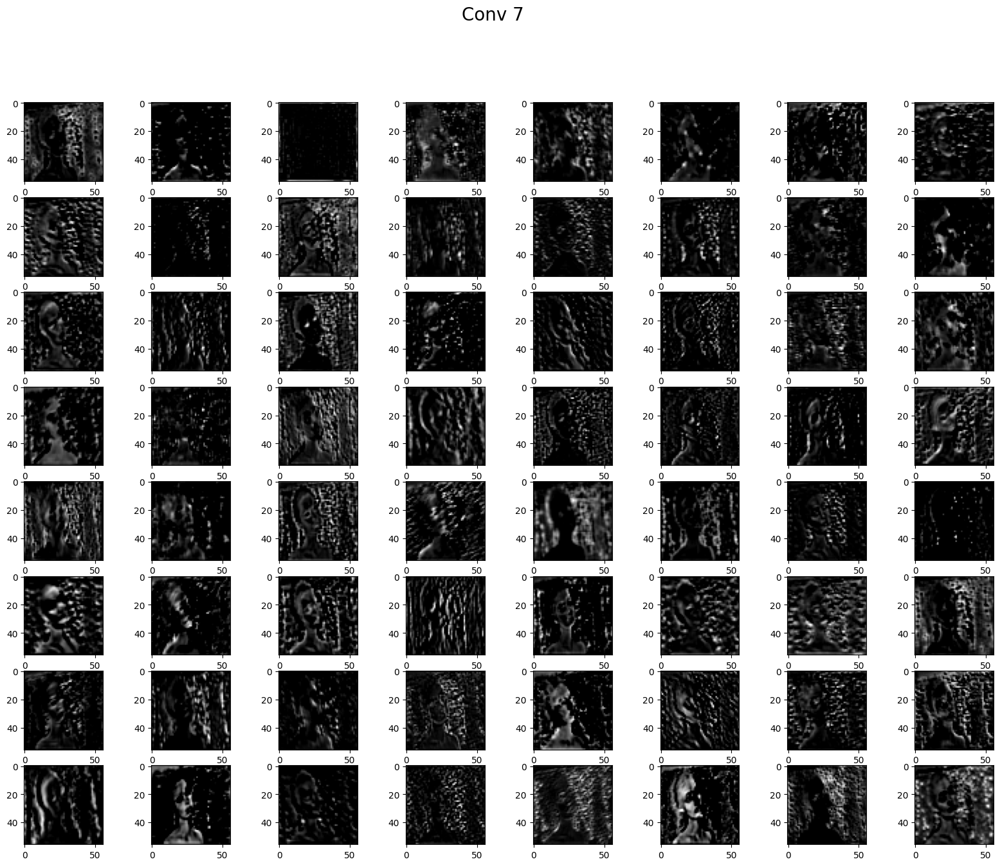

...

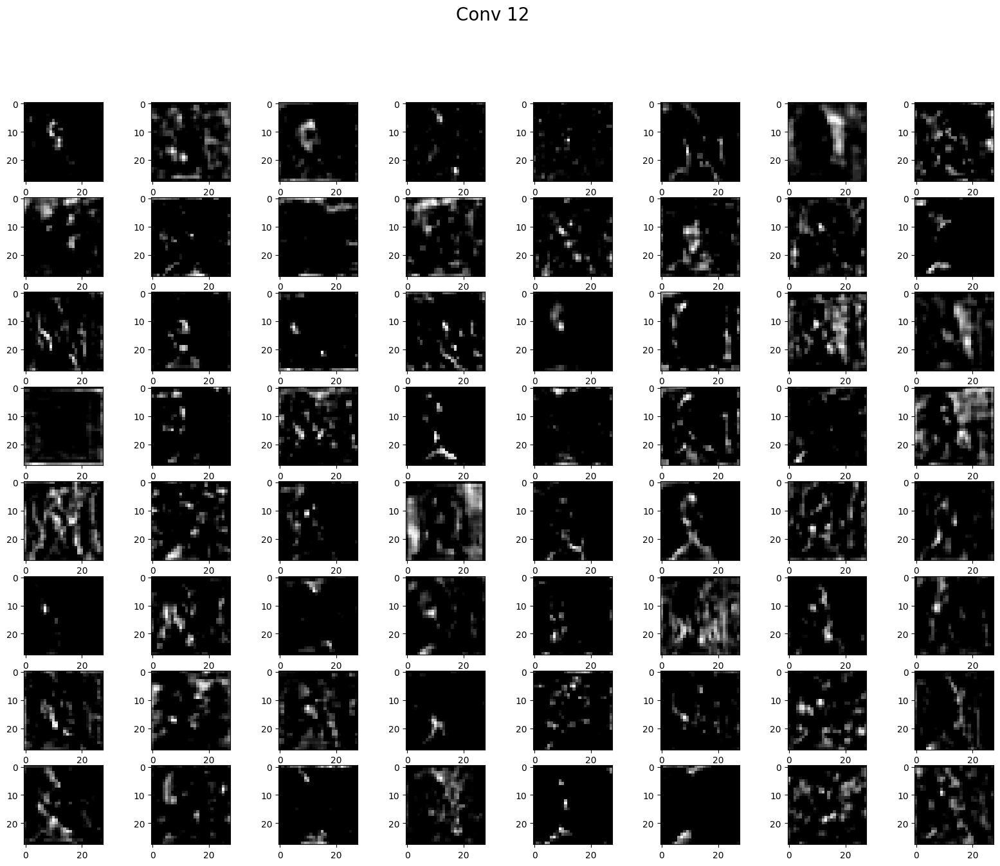

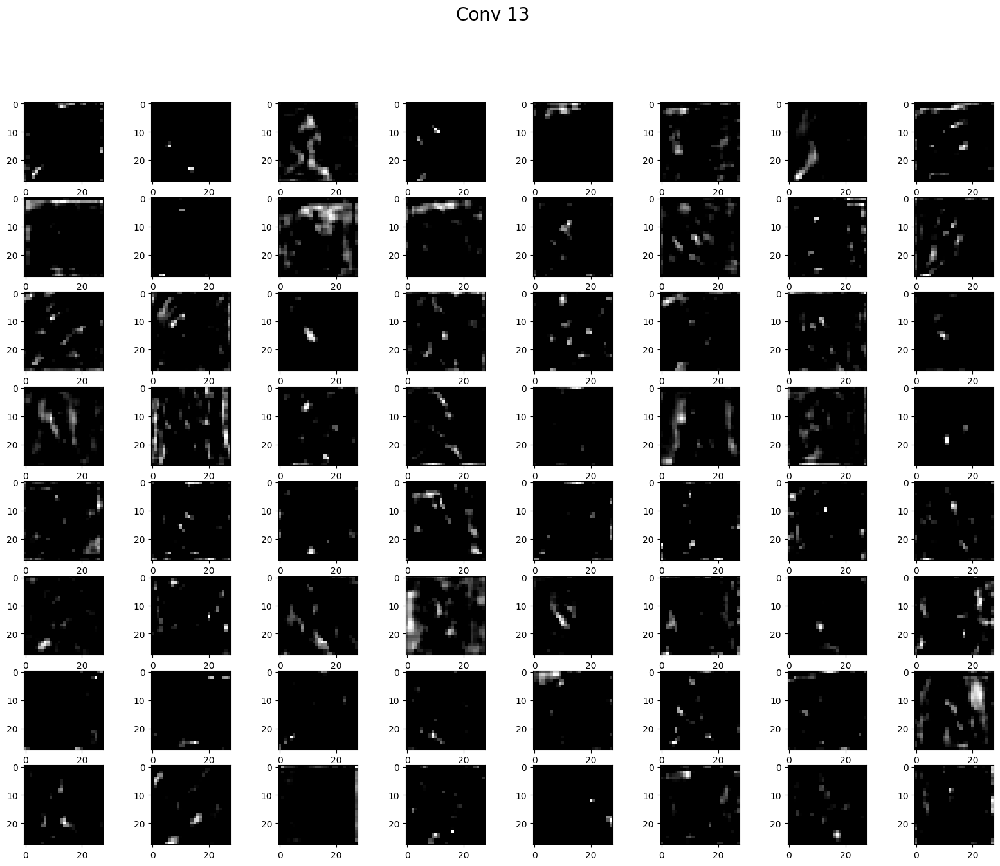

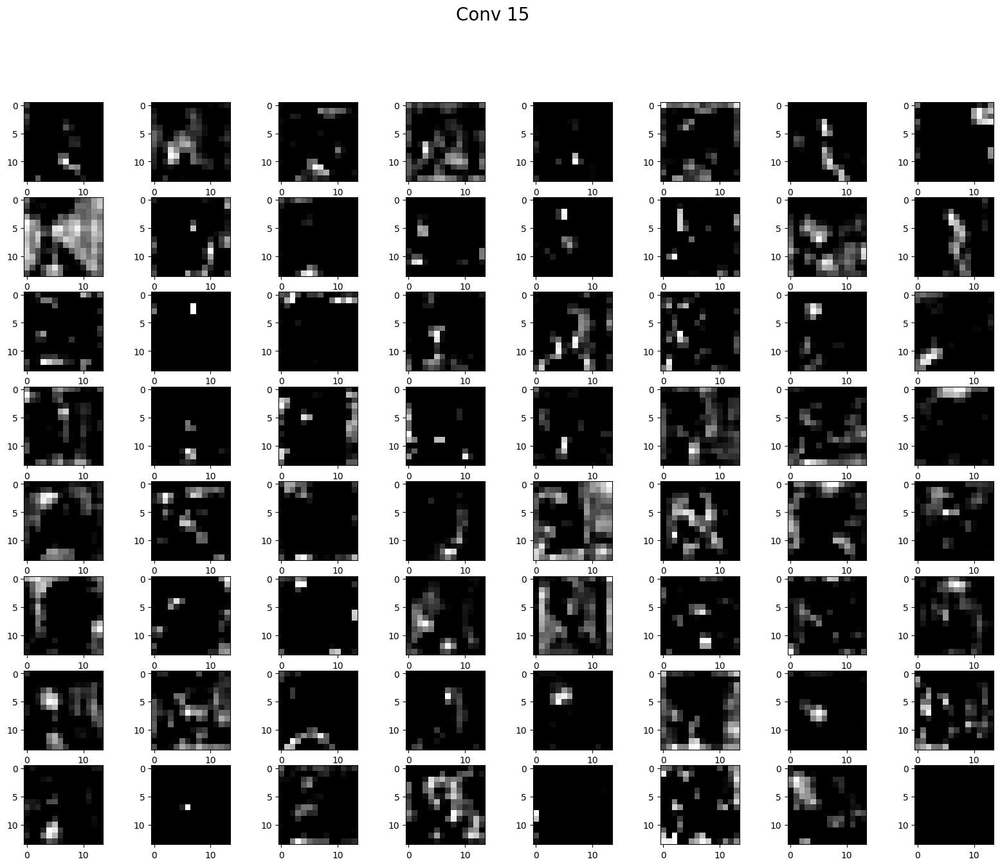

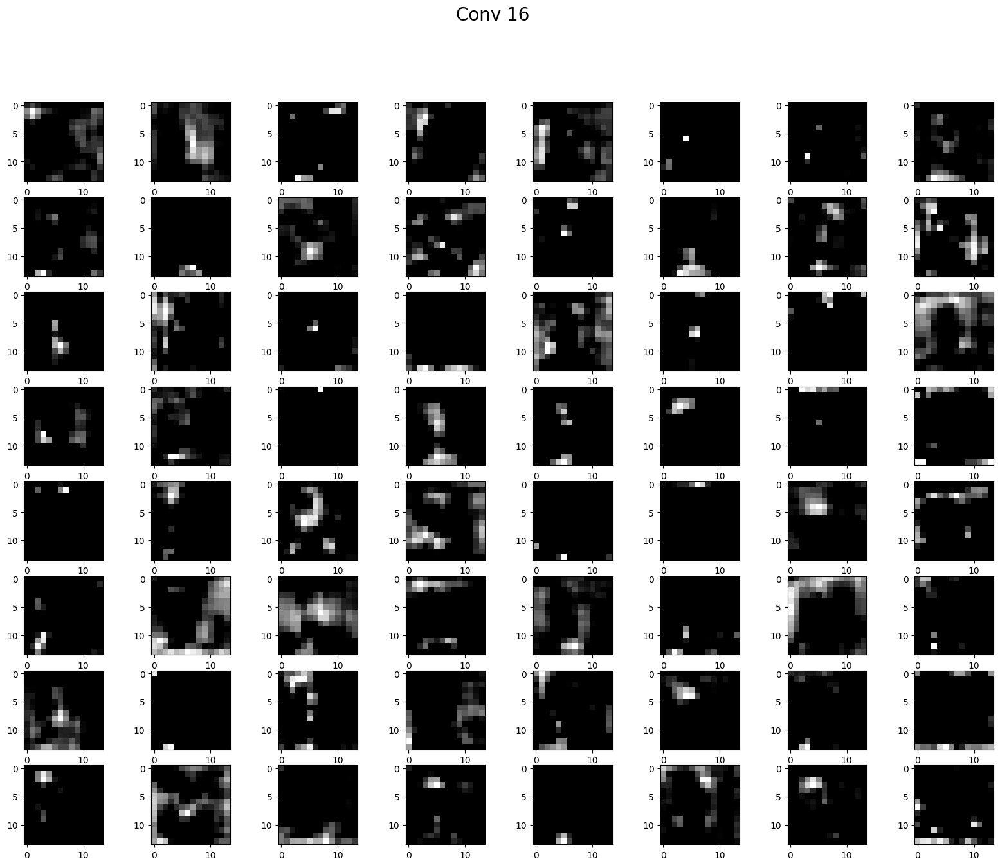

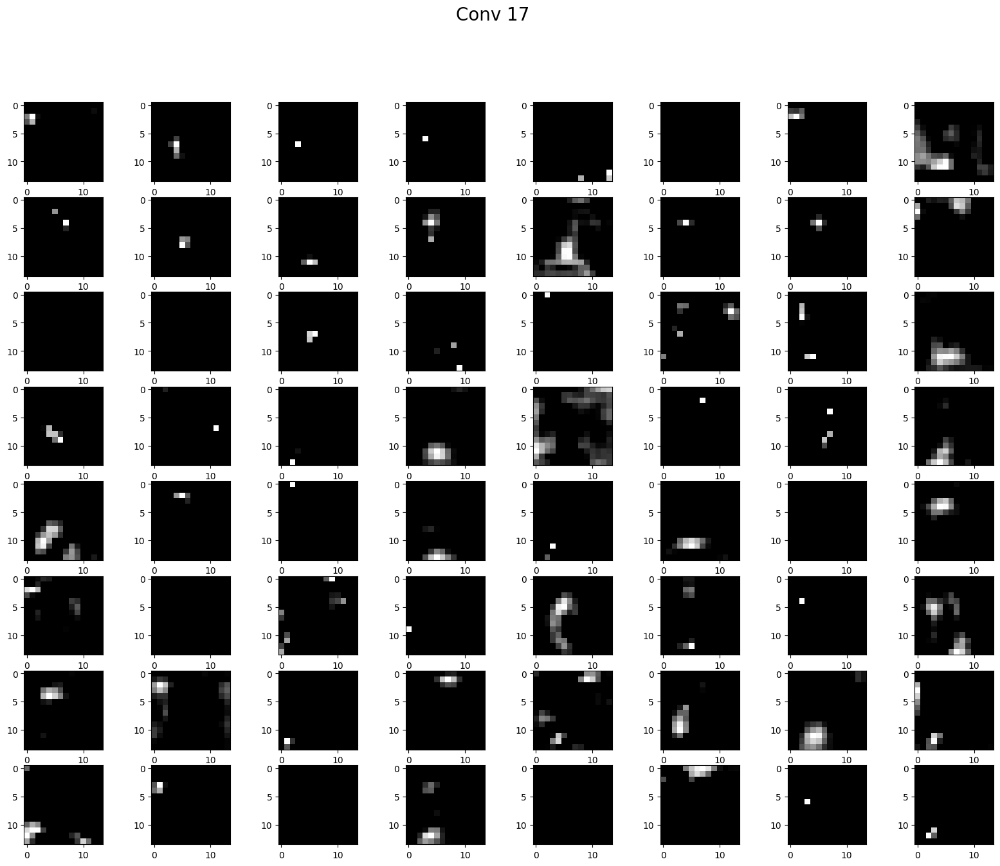

In [20]:
for i, f_map in zip(convlayers_index, feature_maps):
    fig = pyplot.figure(figsize=(20, 15))
    title = 'Conv ' + str(i)
    fig.suptitle(title, fontsize=20)
    for j in range(1, 64 + 1):
        
        pyplot.subplot(8, 8, j)
        pyplot.imshow(f_map[0,:,:,j-1], cmap='gray')
pyplot.show()

Nhận thấy rằng ở Conv17, feature map dưới đây chỉ ra vị trí tương đối của mặt người trong bức ảnh, do càng ở các tầng Conv cuối, thông tin được tổng hợp gần như đầy đủ nhất nên các thông tin có ích sẽ nằm ở các tầng này.
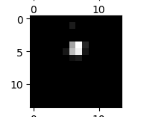

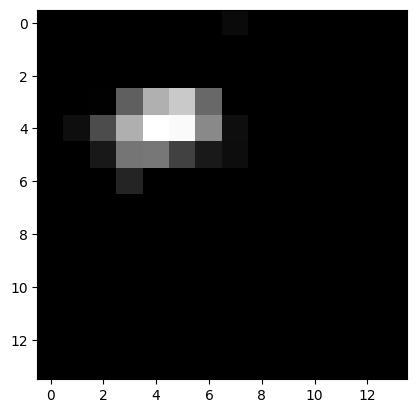

In [21]:
# Lấy ra feature map hữu ích để định vị khuôn mặt người
fmap_localization = feature_maps[12][0,:,:,39]
pyplot.imshow(fmap_localization, cmap='gray')

In [22]:
# Lấy bounding box xung quanh điểm sáng trên feature map
fmap_localization = np.array(fmap_localization).astype('uint8')
# fmap_localization = cv2.fromarray(fmap_localization)
contours, _ = cv2.findContours(fmap_localization, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(contour)



## Face localization based on feature maps

In [23]:
# Tỉ lệ giữa ảnh gốc và feature map
ratio = int(size / fmap_localization.shape[0])
ratio

16

In [24]:
ori_img = np.asarray(ori_img)
ori_img.shape

(224, 224, 3)

In [25]:
x_tl, y_tl  = x * ratio, y * ratio
x_rb, y_rb = x * ratio + w * ratio , y * ratio + h * ratio

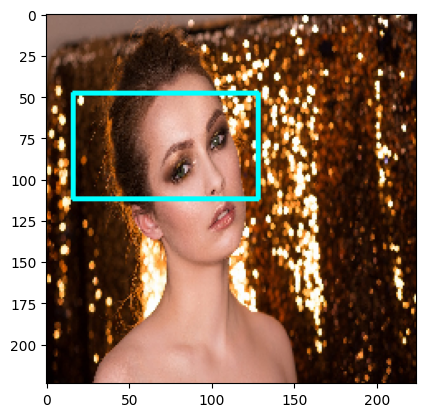

In [26]:
cv2.rectangle(ori_img, (x_tl, y_tl), (x_rb, y_rb), (0, 255, 255), 2)
pyplot.imshow(ori_img)

Reference:
https://www.kaggle.com/code/arpitjain007/guide-to-visualize-filters-and-feature-maps-in-cnn